In [1]:
# Class of k-Nearest Neigbor Classifier


class kNN():
    def __init__(self, k = 3, exp = 2):
    # constructor for kNN classifier 
    # k is the number of neighbor for local class estimation
    # exp is the exponent for the Minkowski distance
        self.k = k
        self.exp = exp
      
    def fit(self, X_train, Y_train):
    # training k-NN method
    # X_train is the training data given with input attributes. n-th row correponds to n-th instance.
    # Y_train is the output data (output vector): n-th element of Y_train is the output value for n-th instance in X_train.
        self.X_train = X_train
        self.Y_train = Y_train   
         
    def getDiscreteClassification(self, X_test):
    # predict-class k-NN method
    # X_test is the test data given with input attributes. Rows correpond to instances
    # Method outputs prediction vector Y_pred_test:  n-th element of Y_pred_test is the prediction for n-th instance in X_test
    
        Y_pred_test = [] #prediction vector Y_pred_test for all the test instances in X_test is initialized to empty list []

   
        for i in range(len(X_test)):   #iterate over all instances in X_test
            test_instance = X_test.iloc[i] #i-th test instance 
            
            distances = []  #list of distances of the i-th test_instance for all the train_instance s in X_train, initially empty.
          
            for j in range(len(self.X_train)):  #iterate over all instances in X_train
                train_instance = self.X_train.iloc[j] #j-th training instance 
                distance = self.Minkowski_distance(test_instance, train_instance) #distance between i-th test instance and j-th training instance  
                distances.append(distance) #add the distance to the list of distances of the i-th test_instance
        
            # Store distances in a dataframe. The dataframe has the index of Y_train in order to keep the correspondence with the classes of the training instances 
            df_dists = pd.DataFrame(data=distances, columns=['dist'], index = self.Y_train.index)
        
            # Sort distances, and only consider the k closest points in the new dataframe df_knn
            df_nn = df_dists.sort_values(by=['dist'], axis=0)
            df_knn =  df_nn[:self.k]
            
            # Note that the index df_knn.index of df_knn contains indices in Y_train of the k-closed training instances to 
            # the i-th test instance. Thus, the dataframe self.Y_train[df_knn.index] contains the classes of those k-closed 
            # training instances. Method value_counts() computes the counts (number of occurencies) for each class in 
            # self.Y_train[df_knn.index] in dataframe predictions. 
            predictions = self.Y_train[df_knn.index].value_counts()
                 
            # the first element of the index predictions.index contains the class with the highest count; i.e. the prediction y_pred_test.
            y_pred_test = predictions.index[0]

            # add the prediction y_pred_test to the prediction vector Y_pred_test for all the test instances in X_test
            Y_pred_test.append(y_pred_test)
        
        return Y_pred_test
 
    def Minkowski_distance(self, x1, x2):
    # computes the Minkowski distance of x1 and x2 for two labeled instances (x1,y1) and (x2,y2)
    
        # Set initial distance to 0
        distance = 0
    
        # Calculate Minkowski distance using the exponent exp
        for i in range(len(x1)):
            distance = distance + abs(x1[i] - x2[i])**self.exp
        
        distance = distance**(1/self.exp)
    
        return distance
    
    def normalize(self, data):
        normalized_data = (data-data.min())/(data.max()-data.min())
        return normalized_data

    def getClassProbs(self, X_test):
        probs = []
        for test_instance in X_test.itertuples(index=False):
            distances = [self.Minkowski_distance(test_instance, train_instance)
                        for train_instance in self.X_train.itertuples(index=False)]
            df_knn = pd.DataFrame({'dist': distances, 'class': self.Y_train})
            df_knn = df_knn.nsmallest(self.k, 'dist')
            class_probs = df_knn['class'].value_counts(normalize=True).to_dict()
            probs.append(class_probs)
        return pd.DataFrame(probs)
    
    def getPrediction(self, X_test):
        
        predictions = []
        for test_instance in X_test.itertuples(index=False):
            distances = [self.Minkowski_distance(test_instance, train_instance)
                        for train_instance in self.X_train.itertuples(index=False)]
            df_knn = pd.DataFrame({'dist': distances, 'value': self.Y_train})
            df_knn = df_knn.nsmallest(self.k, 'dist')
            predictions.append(df_knn['value'].mean())  # Media de valores Y_train de los k vecinos
        return pd.DataFrame(predictions, columns=['Prediction'])

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from numpy.random import random
from sklearn.metrics import accuracy_score, mean_absolute_error
from sklearn.model_selection import train_test_split

In [3]:
diabetes=pd.read_csv('diabetes.csv')
glass=pd.read_csv('glass.csv')
autoprice=pd.read_csv('autoprice.csv')


In [6]:
#probaremos el clasificador con el dataset de diabetes
X = diabetes.iloc[:,:-1]
Y = diabetes.iloc[:,-1]
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.34, random_state=10)

# Definimos un rango de iteraciones para el clasificador
k_range = range(1, 35)


/var/folders/rl/jjdlbdsd5dzcsz5tp6_835300000gn/T/ipykernel_6616/232395805.py:66: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  distance = distance + abs(x1[i] - x2[i])**self.exp
/var/folders/rl/jjdlbdsd5dzcsz5tp6_835300000gn/T/ipykernel_6616/232395805.py:66: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  distance = distance + abs(x1[i] - x2[i])**self.exp
/var/folders/rl/jjdlbdsd5dzcsz5tp6_835300000gn/T/ipykernel_6616/232395805.py:66: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To acc

Text(0, 0.5, 'Accuracy')

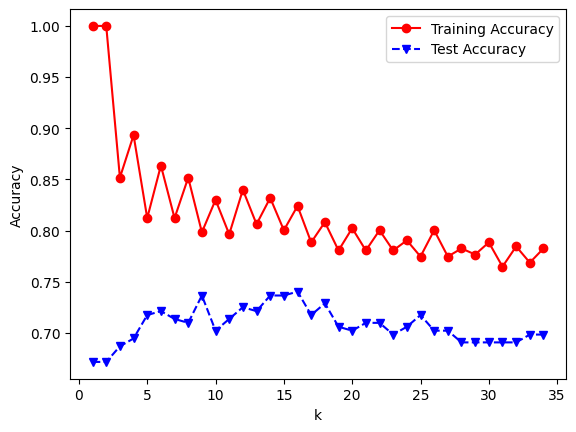

In [ ]:

# Creamos una lista vacía para almacenar los resultados de la precisión  en cada iteración, para cada valor de k en k_range

train_accuracy = []
test_accuracy = []

for k in k_range:
    knn = kNN(k)
    knn.fit(X_train, Y_train)
    Y_pred_train = knn.getDiscreteClassification(X_train)
    Y_pred_test = knn.getDiscreteClassification(X_test)
    train_accuracy.append(accuracy_score(Y_train, Y_pred_train))
    test_accuracy.append(accuracy_score(Y_test, Y_pred_test))

plt.plot(k_range,train_accuracy,'ro-',k_range,test_accuracy,'bv--')
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('k')
plt.ylabel('Accuracy')



Notamos como despues de 16 grupos, la exactitud en los datos de prueba baja por lo que empezaremos a detectar sobre ajuste del modelo.

In [4]:
train_accuracy_norm = []
test_accuracy_norm = []

In [ ]:
for k in k_range:
  knn_norm = kNN(k)
  X_train_norm = knn_norm.normalize(X_train)
  X_test_norm = knn_norm.normalize(X_test)
  knn_norm.fit(X_train_norm, Y_train)
  Y_pred_train = knn_norm.getDiscreteClassification(X_train_norm)
  Y_pred_test = knn_norm.getDiscreteClassification(X_test_norm)
  train_accuracy_norm.append(accuracy_score(Y_train, Y_pred_train))
  test_accuracy_norm.append(accuracy_score(Y_test, Y_pred_test))

plt.plot(k_range,train_accuracy_norm,'ro-',k_range,test_accuracy_norm,'bv--')
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('k')
plt.ylabel('Accuracy diabetes normaized')


In [ ]:
#probaremos el clasificador con el dataset de glass
X = glass.iloc[:,:-1]
Y = glass.iloc[:,-1]
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.34, random_state=10)


In [ ]:
train_accuracy = []
test_accuracy = []

for k in k_range:
    knn = kNN(k)
    knn.fit(X_train, Y_train)
    Y_pred_train = knn.getDiscreteClassification(X_train)
    Y_pred_test = knn.getDiscreteClassification(X_test)
    train_accuracy.append(accuracy_score(Y_train, Y_pred_train))
    test_accuracy.append(accuracy_score(Y_test, Y_pred_test))

plt.plot(k_range,train_accuracy,'ro-',k_range,test_accuracy,'bv--')
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('k')
plt.ylabel('Accuracy glass')

In [ ]:
train_accuracy_norm = []
test_accuracy_norm = []

for k in k_range:
  knn_norm = kNN(k)
  X_train_norm = knn_norm.normalize(X_train)
  X_test_norm = knn_norm.normalize(X_test)
  knn_norm.fit(X_train_norm, Y_train)
  Y_pred_train = knn_norm.getDiscreteClassification(X_train_norm)
  Y_pred_test = knn_norm.getDiscreteClassification(X_test_norm)
  train_accuracy_norm.append(accuracy_score(Y_train, Y_pred_train))
  test_accuracy_norm.append(accuracy_score(Y_test, Y_pred_test))


plt.plot(k_range,train_accuracy_norm,'ro-',k_range,test_accuracy_norm,'bv--')
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('k')
plt.ylabel('Accuracy glass normaized')

In [ ]:


##################################################
# Hold-out testing: Training and Test set creation
##################################################


Y = glass['class']
X = glass.drop(['class'],axis=1)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.34, random_state=10)


# range for the values of parameter exp for kNN

exp_range = [2,  100, 10000]

trainAcc = np.zeros(len(exp_range))
testAcc = np.zeros(len(exp_range))


index = 0
for exp  in  exp_range:
    clf = kNN(k = 3, exp = exp)
    clf.fit(X_train, Y_train)
    Y_predTrain = clf.getDiscreteClassification(X_train)
    Y_predTest = clf.getDiscreteClassification(X_test)
    trainAcc[index] = accuracy_score(Y_train, Y_predTrain)
    testAcc[index] = accuracy_score(Y_test, Y_predTest)
    index += 1


#########################################
# Plot of training and test accuracies
#########################################

plt.plot(exp_range,trainAcc,'ro-',exp_range,testAcc,'bv--')
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('exp')
plt.ylabel('Accuracy')

In [ ]:
X = autoprice.drop(columns=['class'])
Y = autoprice['class']


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=10)


knn = kNN(k=3, exp=2)
knn.fit(X_train, Y_train)


predictions_df = knn.getPrediction(X_test)


mae = mean_absolute_error(Y_test, predictions_df['Prediction'])
print(f'Error Absoluto Medio (MAE): {mae}')


In [ ]:


class_probs_df = knn.getClassProbs(X_test)


print(class_probs_df.head())
print("Suma de probabilidades por fila:", class_probs_df.sum(axis=1).head())
